# HCA Adipocytes - Annotation of batch corrected object
### Owner: Michael Lee
### Input object: heart_adipocytes_scGen_global_ct200422_ml200504.h5ad
## Last edit date: 200722

## Initialisation and importing of data

In [1]:
import numpy as np
import pandas as pd
import anndata
import scanpy as sc
import bbknn
import seaborn as sns

sc.settings.verbosity = 1  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=120, color_map='viridis')
sc.logging.print_versions()

/home/jovyan/my-conda-envs/scanpy1.4.6/lib/python3.8/site-packages/anndata/_core/anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex


scanpy==1.4.6 anndata==0.7.1 umap==0.4.2 numpy==1.18.1 scipy==1.4.1 pandas==1.0.3 scikit-learn==0.22.2.post1 statsmodels==0.11.1 python-igraph==0.8.2


In [2]:
def DEG_table(adata):
    result = adata.uns['rank_genes_groups']
    groups = result['names'].dtype.names
    markers = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
        for group in groups for key in ['names', 'pvals_adj', 'logfoldchanges']})
    return markers

In [3]:
def filtered_DEGs(adata, q_value = 1E-5, fold_change = 1):
    markers = DEG_table(adata)
    groups = adata.uns['rank_genes_groups']['names'].dtype.names
    output = pd.DataFrame()
    for i in groups:
        temp = markers[(markers.loc[:,i+'_p'] <= q_value) & (markers.loc[:,i+'_l'] >= fold_change)].loc[:,(i+'_n'):(i+'_l')]
        temp.reset_index(inplace=True, drop=True)
        output = output.join(temp, how='outer')
    return output

In [4]:
def filtered_DEG_names(adata, q_value = 1E-5, fold_change = 1):
    markers = DEG_table(adata)
    groups = adata.uns['rank_genes_groups']['names'].dtype.names
    output = pd.DataFrame()
    for i in groups:
        temp = markers[(markers.loc[:,i+'_p'] <= q_value) & (markers.loc[:,i+'_l'] >= fold_change)].loc[:,(i+'_n')]
        temp.reset_index(inplace=True, drop=True)
        output = output.join(temp, how='outer')
    return output

In [5]:
heart_adipocytes_orig = sc.read_h5ad('./Output/heart_adipocytes_scGen_global_ct200422_ml200504.h5ad')

In [6]:
heart_adipocytes_orig

AnnData object with n_obs × n_vars = 3799 × 33538 
    obs: 'NRP', 'age_group', 'batch', 'cell_source', 'cell_states', 'cell_type', 'donor', 'gender', 'leiden', 'leiden_annotated', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'source', 'type', 'version', '__is_in_cluster__'
    obsm: 'X_pca', 'X_umap'

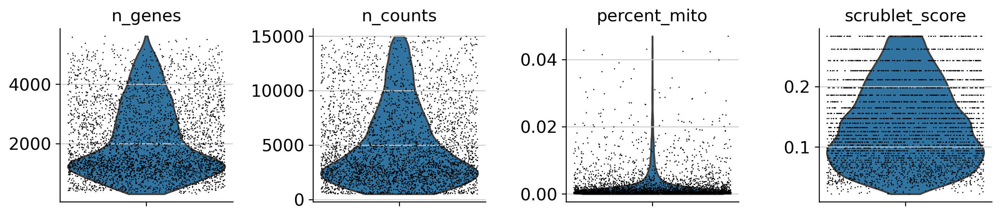

In [7]:
sc.pl.violin(heart_adipocytes_orig, ['n_genes', 'n_counts', 'percent_mito', 'scrublet_score'],
             jitter=0.4, multi_panel=True
             #, save='_adipo.png'
            )

In [8]:
heart_adipocytes_orig.obs.columns

Index(['NRP', 'age_group', 'batch', 'cell_source', 'cell_states', 'cell_type',
       'donor', 'gender', 'leiden', 'leiden_annotated', 'n_counts', 'n_genes',
       'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score',
       'source', 'type', 'version', '__is_in_cluster__'],
      dtype='object')

In [9]:
heart_adipocytes_orig.obs.source.value_counts()

Nuclei    3799
Name: source, dtype: int64

In [11]:
heart_adipocytes_raw = anndata.AnnData(X = heart_adipocytes_orig.raw.X , obs = heart_adipocytes_orig.obs, var = heart_adipocytes_orig.raw.var, obsm = heart_adipocytes_orig.obsm)
heart_adipocytes = heart_adipocytes_raw.copy()

sc.pp.normalize_total(heart_adipocytes, target_sum=1e4)
sc.pp.log1p(heart_adipocytes)
heart_adipocytes.raw = heart_adipocytes.copy()

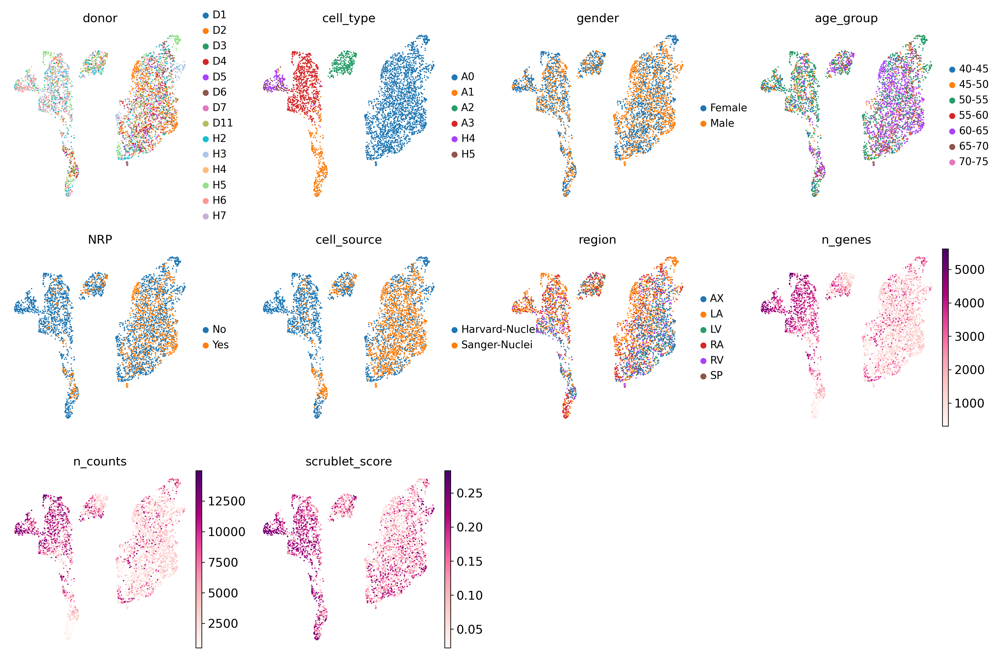

In [12]:
sc.pl.umap(heart_adipocytes, color = ['donor',  'cell_type', 'gender','age_group','NRP', 'cell_source', 'region', 'n_genes', 'n_counts', 'scrublet_score'], size = 10, legend_fontsize = 12, color_map = 'RdPu', frameon = False)

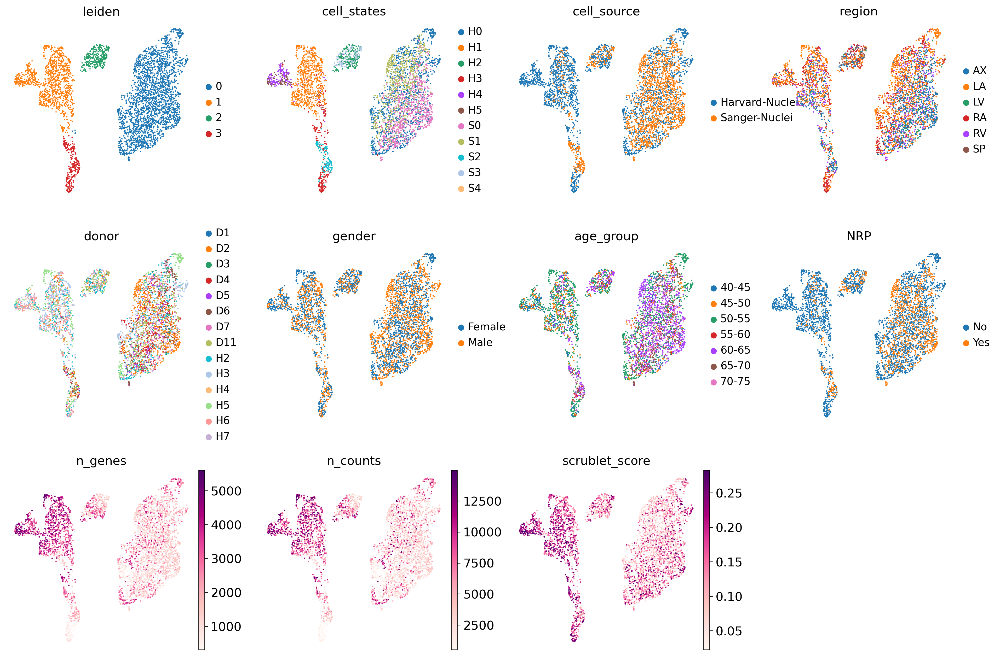

In [13]:
sc.pl.umap(heart_adipocytes, color = ['leiden','cell_states','cell_source', 'region','donor', 'gender','age_group','NRP', 'n_genes', 'n_counts', 'scrublet_score'], size = 10, legend_fontsize = 12, color_map = 'RdPu', frameon = False
          #, save='_heart_adipocytes_scGen_global_merge_immune_adip_merged_ml200324.pdf'
          )

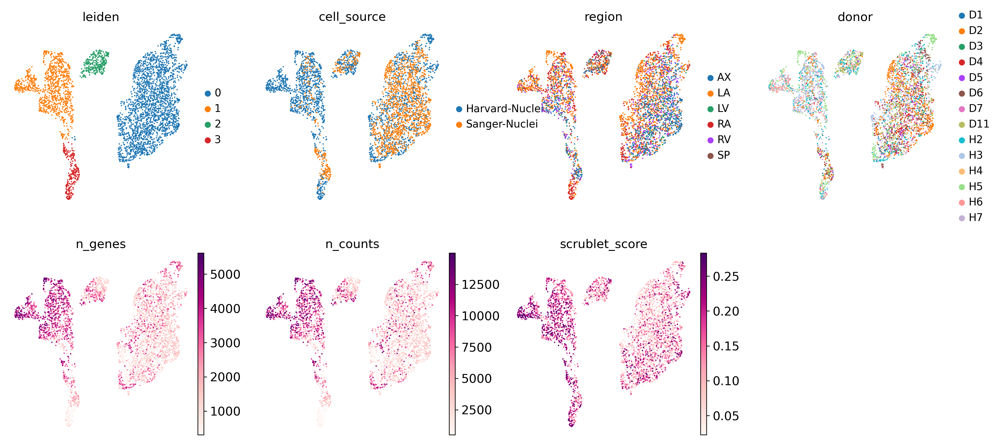

In [14]:
sc.pl.umap(heart_adipocytes, color = ['leiden','cell_source', 'region','donor', 'n_genes', 'n_counts', 'scrublet_score'], size = 10, legend_fontsize = 12, color_map = 'RdPu', frameon = False
          #, save='_2_heart_adipocytes_scGen_global_ct200422_ml200504.pdf'
          )

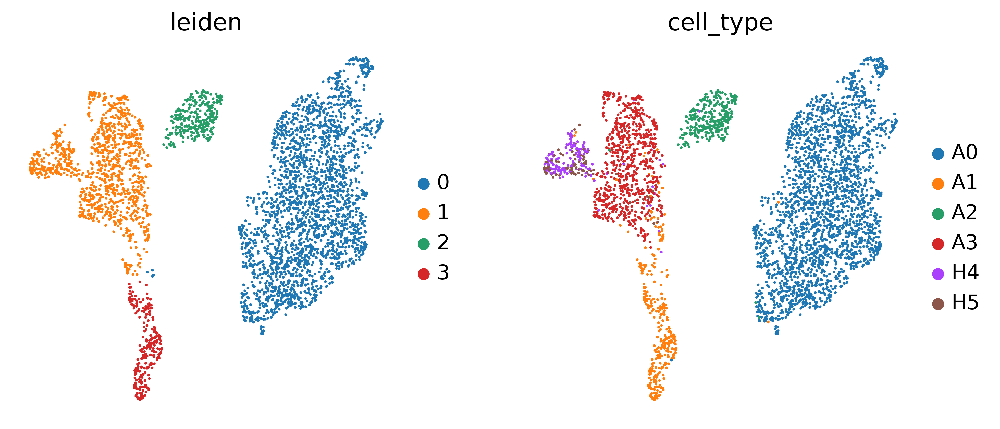

In [15]:
sc.settings.set_figure_params(dpi=240, color_map='viridis')
sc.pl.umap(heart_adipocytes, color = ['leiden', 'cell_type'], size = 10, legend_fontsize = 12, color_map = 'RdPu', use_raw = True, frameon = False
           #,save='_leiden_heart_adipocytes_scGen_global_ct200422_ml200504.pdf'
          )
sc.settings.set_figure_params(dpi=80, color_map='viridis')

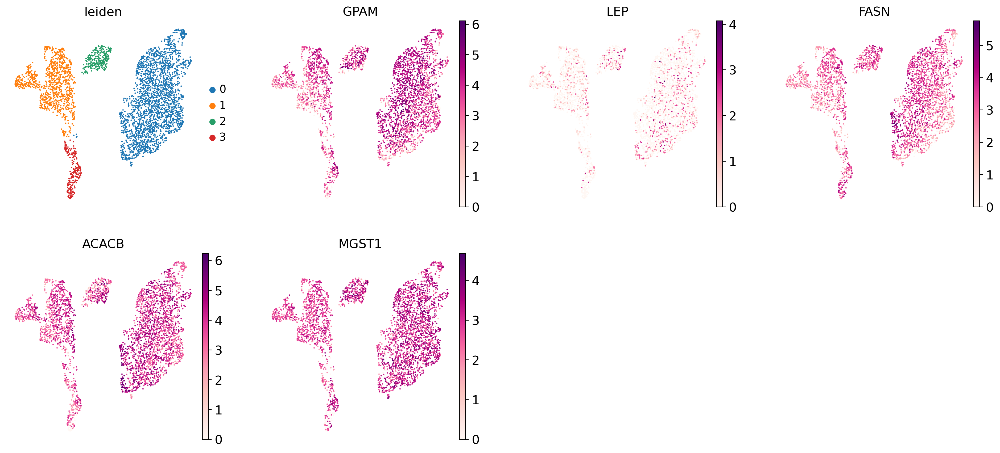

In [16]:
sc.settings.set_figure_params(dpi=120, color_map='viridis')
sc.pl.umap(heart_adipocytes, color = ['leiden', 'GPAM','LEP', 'FASN', 'ACACB', 'MGST1'], size = 10, legend_fontsize = 12, color_map = 'RdPu', use_raw = True, frameon = False)
sc.settings.set_figure_params(dpi=80, color_map='viridis')

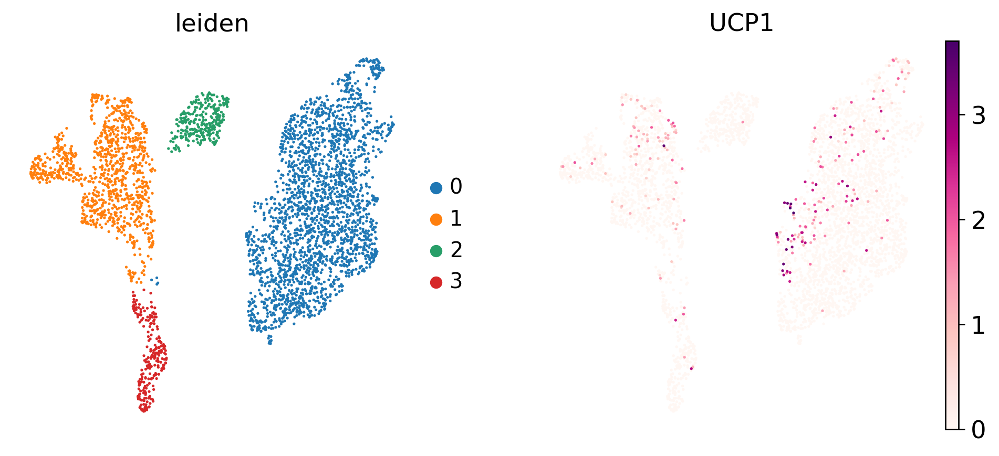

In [17]:
sc.settings.set_figure_params(dpi=120, color_map='viridis')
sc.pl.umap(heart_adipocytes, color = ['leiden', 'UCP1'], size = 10, legend_fontsize = 12, color_map = 'RdPu', use_raw = True, frameon = False)
sc.settings.set_figure_params(dpi=80, color_map='viridis')

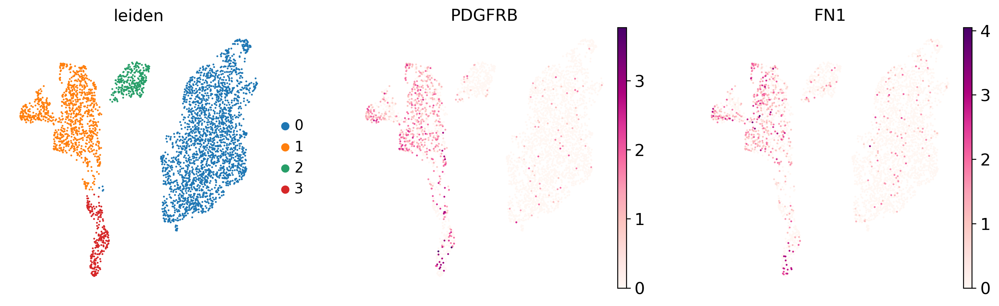

In [18]:
sc.settings.set_figure_params(dpi=120, color_map='viridis')
sc.pl.umap(heart_adipocytes, color = ['leiden', 'PDGFRB', 'FN1' ], size = 10, legend_fontsize = 12, color_map = 'RdPu', use_raw = True, frameon = False)
sc.settings.set_figure_params(dpi=80, color_map='viridis')

In [19]:
sc.tl.rank_genes_groups(heart_adipocytes, 'leiden' , method = 'wilcoxon', n_genes = 500, use_raw = True)
result = heart_adipocytes.uns['rank_genes_groups']
groups = result['names'].dtype.names
markers_adipo = pd.DataFrame(
{group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals_adj', 'logfoldchanges']})
markers_adipo.head(10)

,0_n,0_p,0_l,1_n,1_p,1_l,2_n,2_p,2_l,3_n,3_p,3_l
0,G0S2,2.581184e-80,1.594604,LAMA2,1.819461e-295,4.041743,NAMPT,2.213991e-85,3.170410,TTN,5.666956e-53,3.757832
1,AQP7,3.716012e-74,1.030145,NEGR1,2.384411e-266,4.422756,MT2A,6.403994e-74,3.589434,RYR2,8.622169e-53,3.742752
2,PDE3B,2.546475e-69,0.902959,CDH19,3.617640e-253,5.208636,SLC1A3,6.135693e-69,2.326607,MYBPC3,7.951137e-49,4.465931
3,GPAM,5.068104e-65,1.219448,PRKG1,2.861746e-238,3.497860,CDC42EP4,7.864839e-66,3.049637,ACTC1,2.742746e-43,3.513610
4,NEAT1,1.182048e-61,0.552248,DCLK1,1.237176e-215,4.410380,MT1X,1.618837e-63,2.769856,TNNT2,1.685631e-38,3.450974
5,PPARG,2.428834e-58,0.926283,ABCA9,5.526818e-215,3.512489,SLC39A14,4.924307e-63,3.235037,ANKRD1,1.156964e-37,4.090200
6,MGST1,4.624336e-55,0.581963,BICC1,8.503773e-208,3.846025,STAT3,5.009703e-62,2.138145,TPM1,7.780300e-28,2.736551
7,PNPLA2,6.851903e-54,0.720896,AKT3,1.767988e-203,3.282931,SOCS3,5.626598e-62,3.419974,LDB3,4.317472e-27,3.869190
8,PRKAR2B,1.643145e-53,1.114861,ABCA8,1.345289e-198,3.072943,GADD45B,5.787830e-52,2.457222,FGF12,1.051176e-26,3.376671
9,FABP4,2.759856e-51,1.151584,FBXL7,2.151267e-198,2.934213,SAA1,7.516130e-51,3.023080,MYH6,3.761315e-24,4.256917


In [20]:
sc.tl.filter_rank_genes_groups(heart_adipocytes, min_in_group_fraction=0.4, min_fold_change=1, max_out_group_fraction=0.5)

In [21]:
heart_adipocytes.obs['cell_states'] = heart_adipocytes.obs['leiden']
heart_adipocytes.obs.cell_states.cat.categories = ['Adip1','Adip2','Adip3','Adip4']

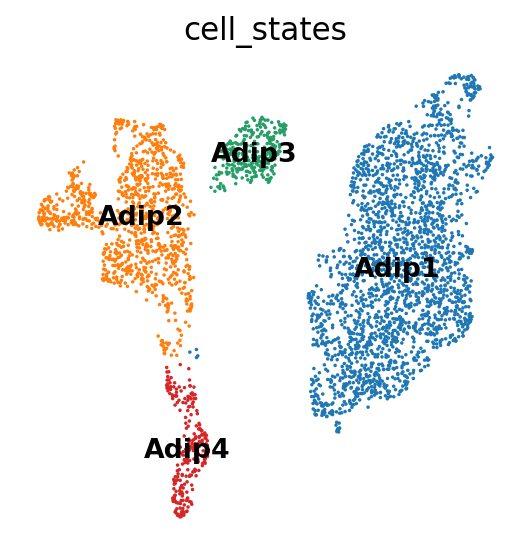

In [22]:
sc.pl.umap(heart_adipocytes, color = ['cell_states'], size = 10, legend_fontsize = 12, color_map = 'RdPu', use_raw = True, frameon = False, legend_loc = 'on data'
           #, save='_heart_adipocytes_scGen_global_ct200422_ml200530_raw.pdf'
          )

In [24]:
sc.tl.rank_genes_groups(heart_adipocytes, 'cell_states', method = 'wilcoxon', n_genes = 500, use_raw = True)

In [25]:
filtered_markers = filtered_DEGs(heart_adipocytes, fold_change = 0.5)
filtered_markers.head(10)

,Adip1_n,Adip1_p,Adip1_l,Adip2_n,Adip2_p,Adip2_l,Adip3_n,Adip3_p,Adip3_l,Adip4_n,Adip4_p,Adip4_l
0,G0S2,2.581184e-80,1.594604,LAMA2,1.819461e-295,4.041743,NAMPT,2.213991e-85,3.170410,TTN,5.666956e-53,3.757832
1,AQP7,3.716012e-74,1.030145,NEGR1,2.384411e-266,4.422756,MT2A,6.403994e-74,3.589434,RYR2,8.622169e-53,3.742752
2,PDE3B,2.546475e-69,0.902959,CDH19,3.617640e-253,5.208636,SLC1A3,6.135693e-69,2.326607,MYBPC3,7.951137e-49,4.465931
3,GPAM,5.068104e-65,1.219448,PRKG1,2.861746e-238,3.497860,CDC42EP4,7.864839e-66,3.049637,ACTC1,2.742746e-43,3.513610
4,NEAT1,1.182048e-61,0.552248,DCLK1,1.237176e-215,4.410380,MT1X,1.618837e-63,2.769856,TNNT2,1.685631e-38,3.450974
5,PPARG,2.428834e-58,0.926283,ABCA9,5.526818e-215,3.512489,SLC39A14,4.924307e-63,3.235037,ANKRD1,1.156964e-37,4.090200
6,MGST1,4.624336e-55,0.581963,BICC1,8.503773e-208,3.846025,STAT3,5.009703e-62,2.138145,TPM1,7.780300e-28,2.736551
7,PNPLA2,6.851903e-54,0.720896,AKT3,1.767988e-203,3.282931,SOCS3,5.626598e-62,3.419974,LDB3,4.317472e-27,3.869190
8,PRKAR2B,1.643145e-53,1.114861,ABCA8,1.345289e-198,3.072943,GADD45B,5.787830e-52,2.457222,FGF12,1.051176e-26,3.376671
9,FABP4,2.759856e-51,1.151584,FBXL7,2.151267e-198,2.934213,SAA1,7.516130e-51,3.023080,MYH6,3.761315e-24,4.256917


In [26]:
filtered_markers_names = filtered_DEG_names(heart_adipocytes, fold_change = 0.5)
filtered_markers_names.transpose()

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
Adip1_n,G0S2,AQP7,PDE3B,GPAM,NEAT1,PPARG,MGST1,PNPLA2,PRKAR2B,FABP4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Adip2_n,LAMA2,NEGR1,CDH19,PRKG1,DCLK1,ABCA9,BICC1,AKT3,ABCA8,FBXL7,...,RFTN1,AC058791.1,AOX1,RB1CC1,FAM135A,USP3,VPS36,RSBN1L,NLGN1,CD34
Adip3_n,NAMPT,MT2A,SLC1A3,CDC42EP4,MT1X,SLC39A14,STAT3,SOCS3,GADD45B,SAA1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Adip4_n,TTN,RYR2,MYBPC3,ACTC1,TNNT2,ANKRD1,TPM1,LDB3,FGF12,MYH6,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [27]:
filtered_markers.to_csv('./Output/_heart_adipocytes_scGen_global_ct200422_ml200530_raw_wilcox_500.tsv', sep = '\t', index = False)

In [28]:
filtered_markers_names.transpose().to_csv('./Output/_heart_adipocytes_scGen_global_ct200422_ml200530_raw_wilcox_DEG_names.csv', sep = ',', index = True, header=False)

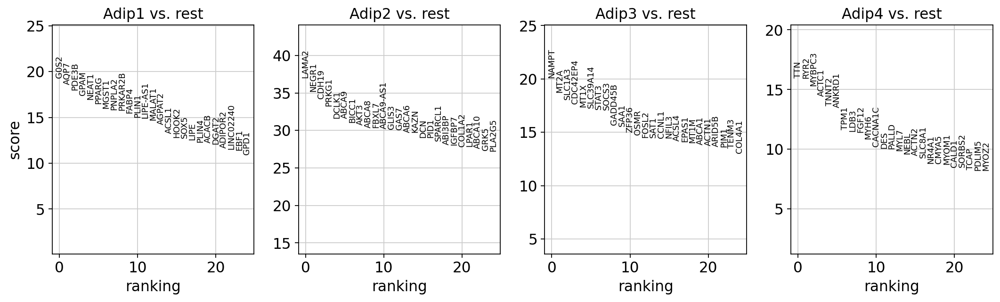

In [33]:
sc.pl.rank_genes_groups(heart_adipocytes, n_genes=25, sharey=False)

In [34]:
sc.tl.dendrogram(heart_adipocytes, groupby='leiden', use_raw=True)

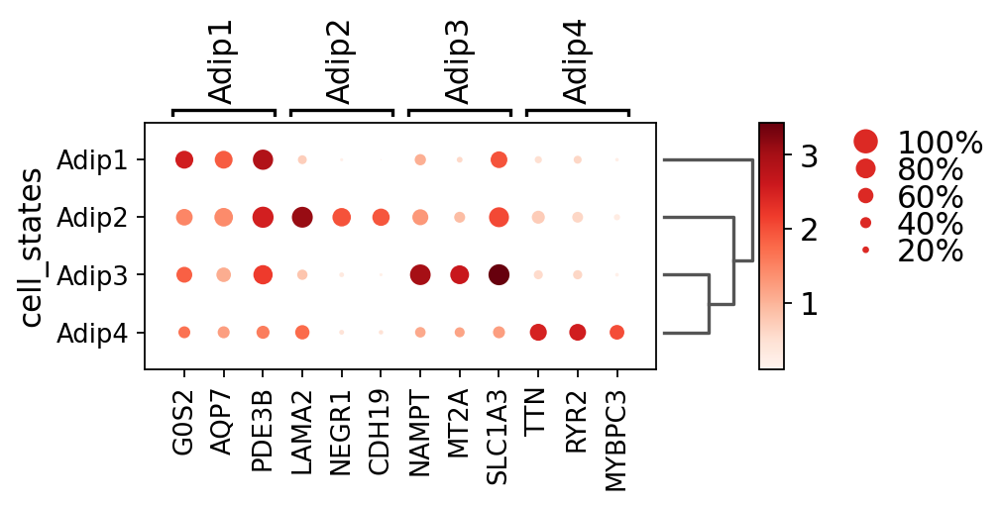

In [35]:
sc.pl.rank_genes_groups_dotplot(heart_adipocytes, key='rank_genes_groups', n_genes=3
                                #,save='_DEGs_heart_adipocytes_scGen_global_ct200422_ml200504.pdf'
)

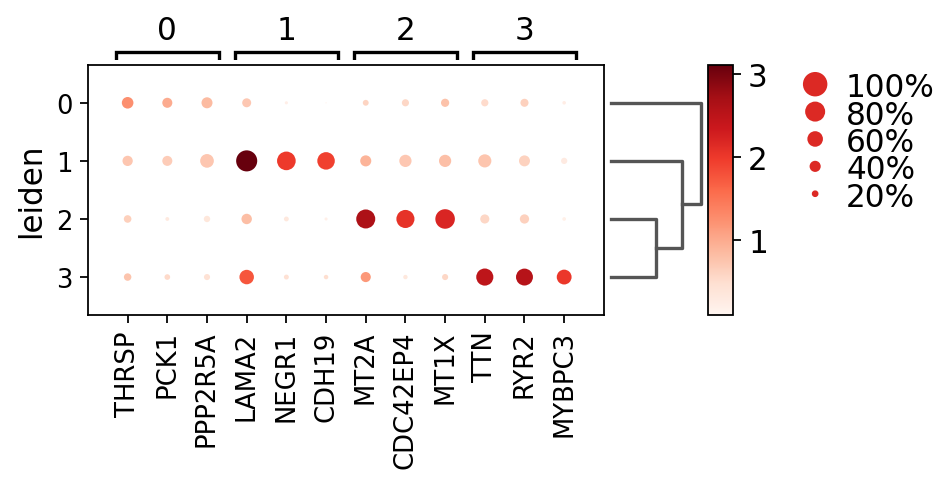

In [36]:
sc.pl.rank_genes_groups_dotplot(heart_adipocytes, key='rank_genes_groups_filtered', n_genes=3, use_raw=True
                               #,save='_filtered_DEGs_heart_adipocytes_scGen_global_ct200422_ml200504.pdf'
                               )

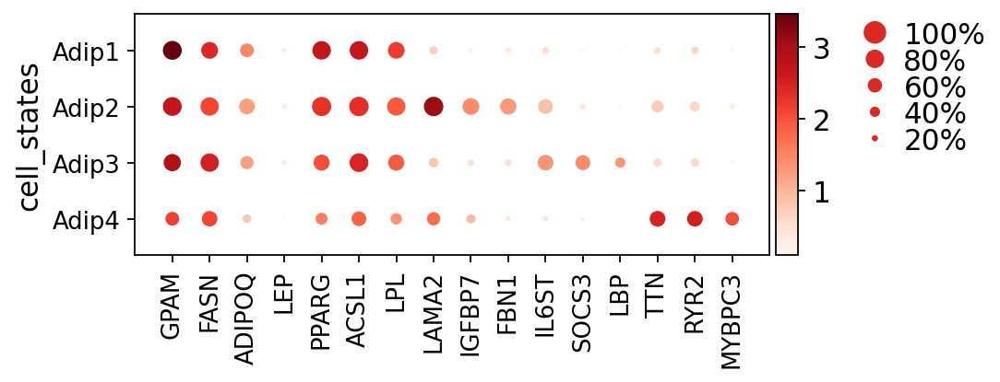

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[5.6, 0, 0.2, 0.5, 0.25])

In [40]:
sc.pl.dotplot(heart_adipocytes, var_names = ['GPAM','FASN','ADIPOQ','LEP','PPARG','ACSL1','LPL','LAMA2','IGFBP7','FBN1','IL6ST','SOCS3','LBP','TTN','RYR2','MYBPC3']
                                            , groupby='cell_states', use_raw=True, dendrogram=False
              #, save='_select_genes_Adip_markers_heart_adipocytes_scGen_global_ct200422_ml200530_raw.pdf'
             )

In [37]:
heart_adipocytes_out = heart_adipocytes.copy()
heart_adipocytes_out.raw = heart_adipocytes_raw.copy()
heart_adipocytes_out.write('./Output/heart_adipocytes_scGen_global_ct200422_ml200530_raw.h5ad')